#**KLASIFIKASI MULTILABEL BATIK BESUREK BENGKULU**

#**Data Loading dan Library**

### Mount Drive

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Import Library

In [11]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.metrics import AUC


### Path Dataset

In [12]:
# Path dataset
train_csv_path = "/content/drive/MyDrive/Dataset/DataNA/train/_classes.csv"
test_csv_path = "/content/drive/MyDrive/Dataset/DataNA/test/_classes.csv"
valid_csv_path = "/content/drive/MyDrive/Dataset/DataNA/valid/_classes.csv"

# folder image dataset
train_img_folder = "/content/drive/MyDrive/Dataset/DataNA/train"
test_img_folder = "/content/drive/MyDrive/Dataset/DataNA/test"
valid_img_folder = "/content/drive/MyDrive/Dataset/DataNA/valid"

# Load CSV
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)
valid_df = pd.read_csv(valid_csv_path)

# Validasi file gambar (hapus file yang tidak ada di folder)
train_df = train_df[train_df['filename'].apply(lambda x: os.path.exists(os.path.join(train_img_folder, x)))]
test_df = test_df[test_df['filename'].apply(lambda x: os.path.exists(os.path.join(test_img_folder, x)))]
valid_df = valid_df[valid_df['filename'].apply(lambda x: os.path.exists(os.path.join(valid_img_folder, x)))]


# **Data Understanding**


### Total Jumlah Data Train dan Test


In [13]:
print("Total gambar Train yang valid:", len(train_df))
print("Total gambar Val yang valid:", len(valid_df))
print("Total gambar Test yang valid:", len(test_df))

Total gambar Train yang valid: 2879
Total gambar Val yang valid: 823
Total gambar Test yang valid: 412


In [14]:
# Tampilkan 5 baris pertama dari train_df
train_df.head()


,filename,Burung Kuau,Burung Punai,Kaligrafi,Kaligrafi Lawas,Kembang Cempaka,Kembang Cengkeh,Kembang Melati,Pohon Hayat,Rafflesia,Relung Paku,Rembulan
0,20241030_153043_jpg.rf.43e2d4ab5bbb5d5180f14cd...,0,0,0,0,0,0,0,0,1,0,0
1,IMG_3020_jpeg_jpg.rf.24996b83770bc3b4af6bca011...,0,0,0,0,0,0,0,0,1,0,0
2,159_jpeg_jpg.rf.baadb4b98b70a0a80af2fa92d2cbe3...,0,0,1,0,0,0,0,0,0,0,1
3,IMG_20250107_144109_jpg.rf.e558d8ef033cc5a74d3...,1,0,1,0,0,0,0,1,0,0,0
4,IMG_20250107_144051_jpg.rf.d199bd6110fb111675a...,1,0,1,0,0,0,0,1,0,0,0


### Jumlah Data di Setiap Label

In [15]:
print("Distribusi Label Train:")
print(train_df.iloc[:, 1:].sum())

print("\nDistribusi Label Valid:")
print(valid_df.iloc[:, 1:].sum())

print("\nDistribusi Label Test:")
print(test_df.iloc[:, 1:].sum())


Distribusi Label Train:
Burung Kuau         690
Burung Punai        335
Kaligrafi          2124
Kaligrafi Lawas     382
Kembang Cempaka     365
Kembang Cengkeh     365
Kembang Melati      371
Pohon Hayat         348
Rafflesia           373
Relung Paku         335
Rembulan            363
dtype: int64

Distribusi Label Valid:
Burung Kuau        204
Burung Punai       123
Kaligrafi          627
Kaligrafi Lawas     90
Kembang Cempaka     98
Kembang Cengkeh     98
Kembang Melati      96
Pohon Hayat         97
Rafflesia          106
Relung Paku        123
Rembulan           106
dtype: int64

Distribusi Label Test:
Burung Kuau        107
Burung Punai        43
Kaligrafi          313
Kaligrafi Lawas     52
Kembang Cempaka     57
Kembang Cengkeh     57
Kembang Melati      54
Pohon Hayat         55
Rafflesia           47
Relung Paku         43
Rembulan            52
dtype: int64


In [16]:
import pandas as pd

# Menghitung jumlah sampel per label di setiap dataset
train_label_counts = train_df.iloc[:, 1:].sum()
valid_label_counts = valid_df.iloc[:, 1:].sum()
test_label_counts = test_df.iloc[:, 1:].sum()

# Membuat DataFrame untuk tampilan tabel
label_distribution_df = pd.DataFrame({
    "Train": train_label_counts,
    "Valid": valid_label_counts,
    "Test": test_label_counts,
    "Total": train_label_counts + valid_label_counts + test_label_counts  # Menambahkan kolom total
})

# Menampilkan tabel dengan format rapi
print("\n=== Distribusi Label di Dataset ===")
print(label_distribution_df)



=== Distribusi Label di Dataset ===
                 Train  Valid  Test  Total
Burung Kuau        690    204   107   1001
Burung Punai       335    123    43    501
Kaligrafi         2124    627   313   3064
Kaligrafi Lawas    382     90    52    524
Kembang Cempaka    365     98    57    520
Kembang Cengkeh    365     98    57    520
Kembang Melati     371     96    54    521
Pohon Hayat        348     97    55    500
Rafflesia          373    106    47    526
Relung Paku        335    123    43    501
Rembulan           363    106    52    521


### Grafik Distribusi Label

<ipython-input-17-3249943042>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')


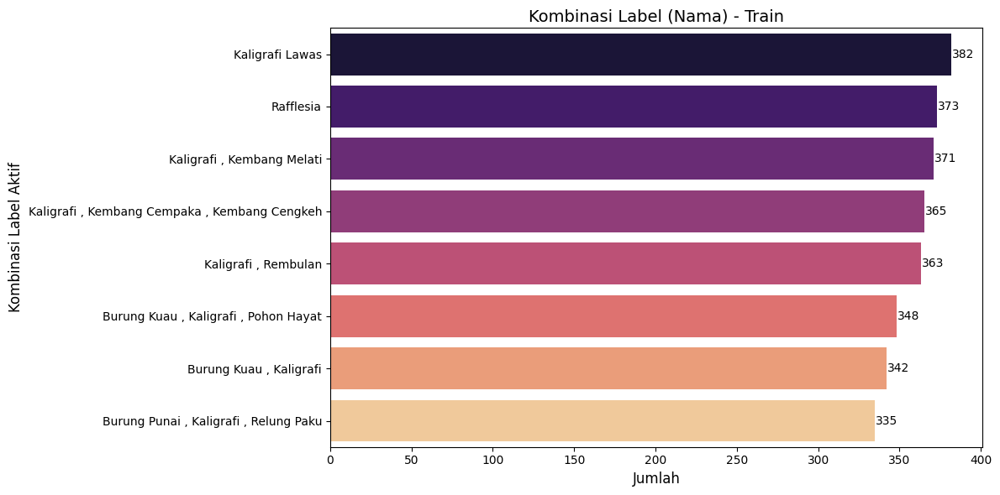

<ipython-input-17-3249943042>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')


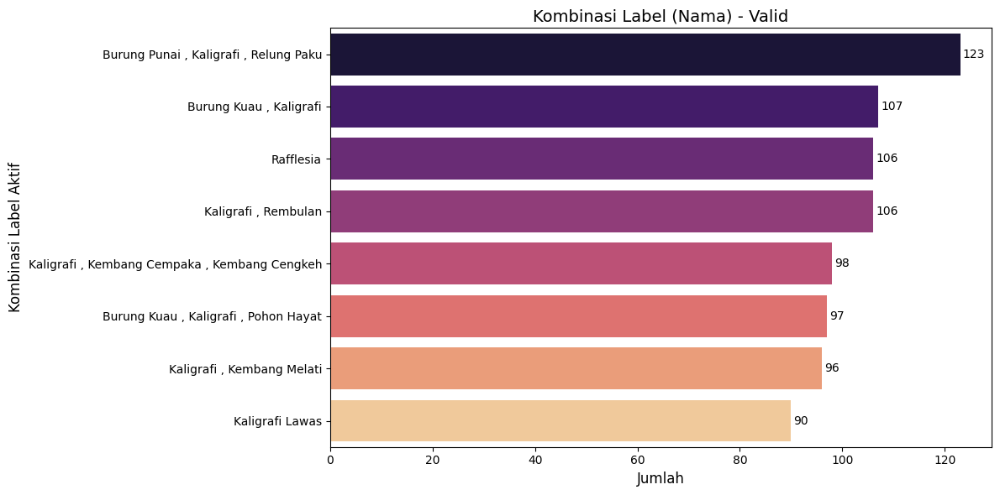

<ipython-input-17-3249943042>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')


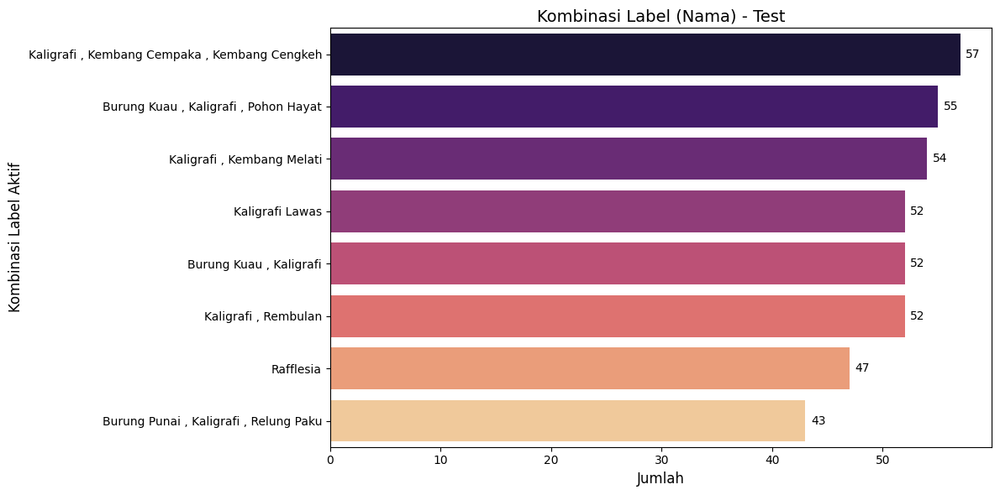

In [17]:
# Fungsi ambil kombinasi label pakai nama label
def get_named_label_combinations(df):
    label_cols = df.columns[1:]  # Ambil semua kolom label
    def combo_to_names(row):
        return ' , '.join([label for label, val in zip(label_cols, row) if val == 1]) or 'No Label'

    combos = df[label_cols].apply(combo_to_names, axis=1)
    combo_counts = combos.value_counts().reset_index()
    combo_counts.columns = ['Label Combination', 'Count']
    return combo_counts

# Fungsi buat plot + label jumlah
def plot_combinations(combo_counts, dataset_name):
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')
    plt.title(f'Kombinasi Label (Nama) - {dataset_name}', fontsize=14)
    plt.xlabel('Jumlah', fontsize=12)
    plt.ylabel('Kombinasi Label Aktif', fontsize=12)

    # Tambahkan teks jumlah di ujung bar
    for i, (count) in enumerate(combo_counts['Count']):
        ax.text(count + 0.5, i, str(count), color='black', va='center', fontsize=10)

    plt.tight_layout()
    plt.show()

# Load dan filter ulang seperti biasa
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)
valid_df = pd.read_csv(valid_csv_path)

train_df = train_df[train_df['filename'].apply(lambda x: os.path.exists(os.path.join(train_img_folder, x)))]
test_df = test_df[test_df['filename'].apply(lambda x: os.path.exists(os.path.join(test_img_folder, x)))]
valid_df = valid_df[valid_df['filename'].apply(lambda x: os.path.exists(os.path.join(valid_img_folder, x)))]

# Plot kombinasi label (dengan nama & jumlah) untuk tiap dataset
plot_combinations(get_named_label_combinations(train_df), "Train")
plot_combinations(get_named_label_combinations(valid_df), "Valid")
plot_combinations(get_named_label_combinations(test_df), "Test")


### Sampel Gambar dan Label

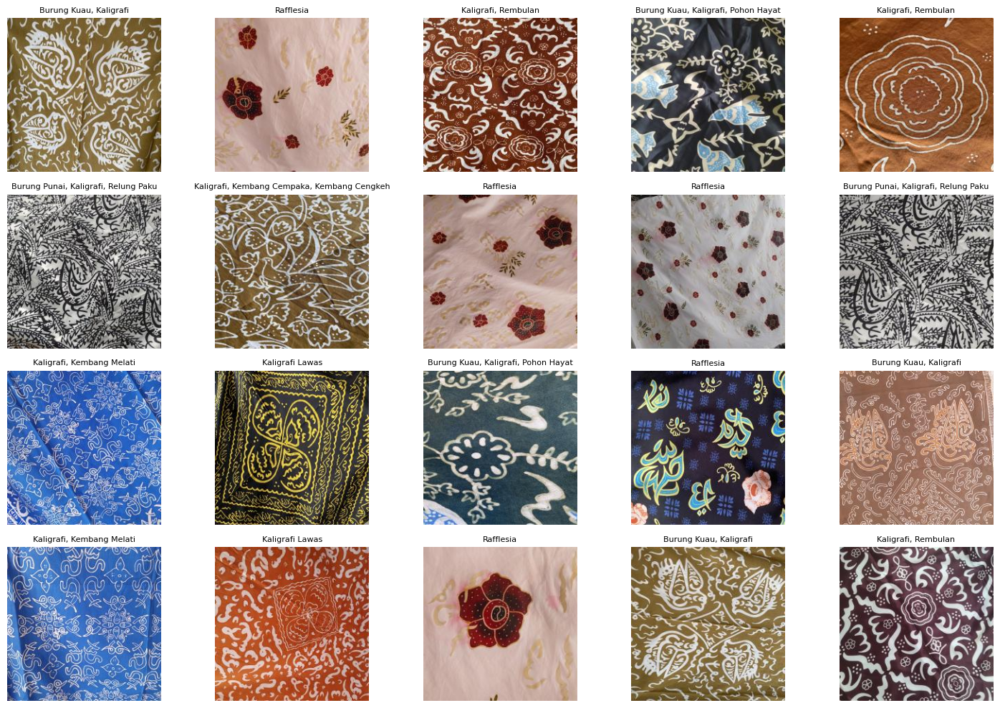

In [18]:
from PIL import Image


# Fungsi untuk konversi row label jadi teks label
def get_labels(row, label_cols):
    return ', '.join([label for label in label_cols if row[label] == 1]) or 'No Label'

# Ambil 20 sampel acak dari train_df
sample_df = train_df.sample(n=20, random_state=42).reset_index(drop=True)
label_cols = train_df.columns[1:]

# Plot gambar
plt.figure(figsize=(15, 10))
for i in range(20):
    img_path = os.path.join(train_img_folder, sample_df.loc[i, 'filename'])
    img = Image.open(img_path).convert('RGB')

    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(get_labels(sample_df.loc[i], label_cols), fontsize=8)

plt.tight_layout()
plt.show()


# **Data Preparation**

### Augmentasi Data Train

In [19]:
label_columns = train_df.columns[1:].tolist()

image_size = (224, 224)
batch_size = 32

# Normalisasi data
datagen = ImageDataGenerator(rescale=1.0 / 255)

### Data Generator



In [20]:
# Train generator
train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_img_folder,
    x_col='filename',
    y_col=label_columns,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='raw',
    shuffle=True,
)

# Validation generator
valid_generator = datagen.flow_from_dataframe(
    dataframe=valid_df,
    directory=valid_img_folder,
    x_col='filename',
    y_col=label_columns,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='raw',
    shuffle=False
)

# Test generator
test_generator = datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_img_folder,
    x_col='filename',
    y_col=label_columns,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='raw',
    shuffle=False
)

Found 2879 validated image filenames.
Found 823 validated image filenames.
Found 412 validated image filenames.


In [21]:
# Ambil satu batch sample dari train_generator
x_batch, y_batch = next(train_generator)

# Cek shape input dan label
print(f"Shape input batch: {x_batch.shape}")  # Harusnya (batch_size, 224, 224, 3)
print(f"Shape label batch: {y_batch.shape}")  # Harusnya (batch_size, jumlah_kelas)

Shape input batch: (32, 224, 224, 3)
Shape label batch: (32, 11)


# **Modeling**

### Pembuatan Model

In [ ]:
from tensorflow.keras.applications import VGG16

# Load VGG16 tanpa fully connected layer atas (include_top=False)
base_model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze semua layer di VGG16 agar hanya bagian atas yang dilatih
base_model.trainable = False

# Custom head untuk multi-label classification
x = GlobalAveragePooling2D()(base_model.output)
x = Dropout(0.5)(x)
output = Dense(11, activation='sigmoid')(x)  # Multi-label classification

# Gabungkan base model + custom head
model = Model(inputs=base_model.input, outputs=output)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


### Compile Model

In [ ]:
# Path penyimpanan model di Google Drive
best_model_path = "/content/drive/MyDrive/Dataset/VGG16_2.h5"

# Compile model dengan optimizer Adam dan AUC sebagai metric
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.AUC(name="auc")]
)

# Callbacks untuk early stopping, learning rate reduction, dan model checkpoint
callbacks = [
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-7),
    ModelCheckpoint(best_model_path, save_best_only=True, monitor="val_loss", mode="min")
]

# Tampilkan arsitektur model
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 11)             │         5,643 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,720,331 (56.15 MB)

 Trainable params: 5,643 (22.04 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

### Train Model

In [ ]:
history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=30,
    callbacks=callbacks
)
#12.52am- 2.14 am

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - auc: 0.4390 - loss: 0.7510 

90/90 ━━━━━━━━━━━━━━━━━━━━ 1357s 15s/step - auc: 0.4392 - loss: 0.7506 - val_auc: 0.5157 - val_loss: 0.5954 - learning_rate: 1.0000e-04
Epoch 2/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - auc: 0.5261 - loss: 0.6213

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 256ms/step - auc: 0.5263 - loss: 0.6211 - val_auc: 0.6594 - val_loss: 0.5090 - learning_rate: 1.0000e-04
Epoch 3/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - auc: 0.6091 - loss: 0.5391

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - auc: 0.6092 - loss: 0.5389 - val_auc: 0.7050 - val_loss: 0.4584 - learning_rate: 1.0000e-04
Epoch 4/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - auc: 0.6693 - loss: 0.4874

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 255ms/step - auc: 0.6694 - loss: 0.4873 - val_auc: 0.7451 - val_loss: 0.4273 - learning_rate: 1.0000e-04
Epoch 5/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - auc: 0.6886 - loss: 0.4590

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 253ms/step - auc: 0.6888 - loss: 0.4589 - val_auc: 0.7855 - val_loss: 0.4066 - learning_rate: 1.0000e-04
Epoch 6/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - auc: 0.7215 - loss: 0.4333

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 258ms/step - auc: 0.7216 - loss: 0.4333 - val_auc: 0.8232 - val_loss: 0.3917 - learning_rate: 1.0000e-04
Epoch 7/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - auc: 0.7449 - loss: 0.4164

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - auc: 0.7449 - loss: 0.4164 - val_auc: 0.8540 - val_loss: 0.3797 - learning_rate: 1.0000e-04
Epoch 8/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - auc: 0.7631 - loss: 0.4014

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - auc: 0.7632 - loss: 0.4014 - val_auc: 0.8785 - val_loss: 0.3693 - learning_rate: 1.0000e-04
Epoch 9/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - auc: 0.7861 - loss: 0.3902

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 258ms/step - auc: 0.7862 - loss: 0.3902 - val_auc: 0.8982 - val_loss: 0.3601 - learning_rate: 1.0000e-04
Epoch 10/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - auc: 0.8023 - loss: 0.3809

90/90 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - auc: 0.8023 - loss: 0.3809 - val_auc: 0.9138 - val_loss: 0.3514 - learning_rate: 1.0000e-04
Epoch 11/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - auc: 0.8249 - loss: 0.3690

90/90 ━━━━━━━━━━━━━━━━━━━━ 24s 268ms/step - auc: 0.8249 - loss: 0.3690 - val_auc: 0.9258 - val_loss: 0.3431 - learning_rate: 1.0000e-04
Epoch 12/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - auc: 0.8378 - loss: 0.3616

90/90 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - auc: 0.8379 - loss: 0.3616 - val_auc: 0.9362 - val_loss: 0.3351 - learning_rate: 1.0000e-04
Epoch 13/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - auc: 0.8569 - loss: 0.3514

90/90 ━━━━━━━━━━━━━━━━━━━━ 43s 265ms/step - auc: 0.8569 - loss: 0.3514 - val_auc: 0.9434 - val_loss: 0.3276 - learning_rate: 1.0000e-04
Epoch 14/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - auc: 0.8689 - loss: 0.3442

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - auc: 0.8689 - loss: 0.3441 - val_auc: 0.9486 - val_loss: 0.3201 - learning_rate: 1.0000e-04
Epoch 15/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - auc: 0.8822 - loss: 0.3354

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - auc: 0.8823 - loss: 0.3354 - val_auc: 0.9531 - val_loss: 0.3130 - learning_rate: 1.0000e-04
Epoch 16/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - auc: 0.8947 - loss: 0.3286

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - auc: 0.8947 - loss: 0.3286 - val_auc: 0.9564 - val_loss: 0.3062 - learning_rate: 1.0000e-04
Epoch 17/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - auc: 0.9011 - loss: 0.3224

90/90 ━━━━━━━━━━━━━━━━━━━━ 25s 271ms/step - auc: 0.9011 - loss: 0.3224 - val_auc: 0.9600 - val_loss: 0.2997 - learning_rate: 1.0000e-04
Epoch 18/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - auc: 0.9054 - loss: 0.3200

90/90 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - auc: 0.9055 - loss: 0.3199 - val_auc: 0.9625 - val_loss: 0.2933 - learning_rate: 1.0000e-04
Epoch 19/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - auc: 0.9251 - loss: 0.3058

90/90 ━━━━━━━━━━━━━━━━━━━━ 42s 263ms/step - auc: 0.9251 - loss: 0.3058 - val_auc: 0.9654 - val_loss: 0.2873 - learning_rate: 1.0000e-04
Epoch 20/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - auc: 0.9270 - loss: 0.3021

90/90 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - auc: 0.9270 - loss: 0.3021 - val_auc: 0.9676 - val_loss: 0.2814 - learning_rate: 1.0000e-04
Epoch 21/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - auc: 0.9320 - loss: 0.2970

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - auc: 0.9320 - loss: 0.2970 - val_auc: 0.9695 - val_loss: 0.2756 - learning_rate: 1.0000e-04
Epoch 22/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - auc: 0.9430 - loss: 0.2845

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - auc: 0.9429 - loss: 0.2845 - val_auc: 0.9712 - val_loss: 0.2700 - learning_rate: 1.0000e-04
Epoch 23/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - auc: 0.9427 - loss: 0.2843

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - auc: 0.9427 - loss: 0.2843 - val_auc: 0.9731 - val_loss: 0.2647 - learning_rate: 1.0000e-04
Epoch 24/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - auc: 0.9439 - loss: 0.2794

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - auc: 0.9439 - loss: 0.2794 - val_auc: 0.9745 - val_loss: 0.2595 - learning_rate: 1.0000e-04
Epoch 25/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - auc: 0.9538 - loss: 0.2706

90/90 ━━━━━━━━━━━━━━━━━━━━ 41s 255ms/step - auc: 0.9538 - loss: 0.2706 - val_auc: 0.9757 - val_loss: 0.2545 - learning_rate: 1.0000e-04
Epoch 26/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - auc: 0.9536 - loss: 0.2689

90/90 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - auc: 0.9536 - loss: 0.2689 - val_auc: 0.9768 - val_loss: 0.2498 - learning_rate: 1.0000e-04
Epoch 27/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - auc: 0.9584 - loss: 0.2603

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 258ms/step - auc: 0.9584 - loss: 0.2603 - val_auc: 0.9779 - val_loss: 0.2451 - learning_rate: 1.0000e-04
Epoch 28/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - auc: 0.9549 - loss: 0.2609

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - auc: 0.9550 - loss: 0.2609 - val_auc: 0.9786 - val_loss: 0.2406 - learning_rate: 1.0000e-04
Epoch 29/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - auc: 0.9579 - loss: 0.2578

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - auc: 0.9579 - loss: 0.2578 - val_auc: 0.9794 - val_loss: 0.2363 - learning_rate: 1.0000e-04
Epoch 30/30
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - auc: 0.9607 - loss: 0.2512

90/90 ━━━━━━━━━━━━━━━━━━━━ 23s 254ms/step - auc: 0.9607 - loss: 0.2512 - val_auc: 0.9802 - val_loss: 0.2320 - learning_rate: 1.0000e-04


### Plotting

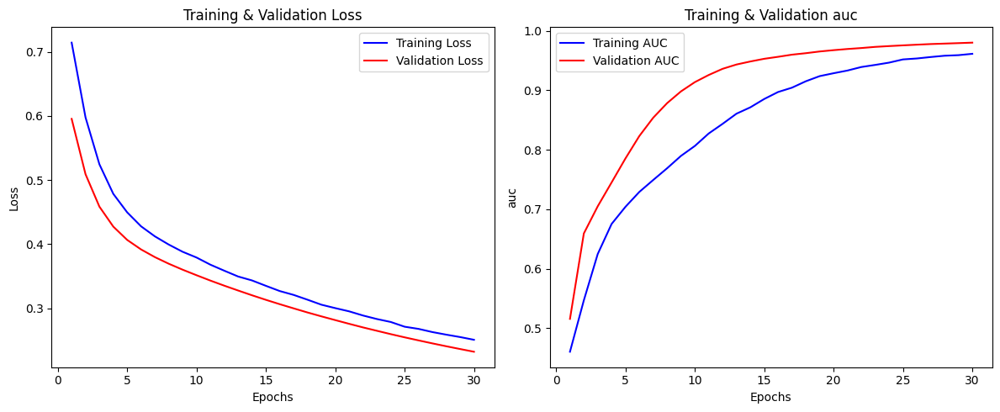

In [ ]:
# Ambil data dari history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_auc = history.history['auc']
val_auc = history.history['val_auc']

epochs = range(1, len(train_loss) + 1)

# Plot Loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()

# Plot AUC
plt.subplot(1, 2, 2)
plt.plot(epochs, train_auc, 'b-', label='Training AUC')
plt.plot(epochs, val_auc, 'r-', label='Validation AUC')
plt.xlabel('Epochs')
plt.ylabel('auc')
plt.title('Training & Validation auc')
plt.legend()

plt.tight_layout()
plt.show()


# **Evaluasi**

### Prediksi dengan test set

In [22]:
# Load model
best_model_path = "/content/drive/MyDrive/Dataset/VGG16_2.h5"
model = tf.keras.models.load_model(best_model_path)

# Prediksi pada test set
y_pred_prob = model.predict(test_generator)
y_pred = (y_pred_prob > 0.5).astype(int)

test_loss, test_auc = model.evaluate(test_generator)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test AUC: {test_auc:.4f}")


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 142s 11s/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 208ms/step - auc: 0.9783 - loss: 0.2385
Test Loss: 0.2396
Test AUC: 0.9783


### Classification Report

In [23]:
# Ambil label asli
y_true = test_df.iloc[:, 1:].values  # Mengambil nilai label dari dataframe
labels = test_df.columns[1:].tolist()

# Classification Report
print(classification_report(y_true, y_pred, target_names=labels))


                 precision    recall  f1-score   support

    Burung Kuau       1.00      0.43      0.60       107
   Burung Punai       1.00      0.77      0.87        43
      Kaligrafi       0.82      1.00      0.90       313
Kaligrafi Lawas       0.00      0.00      0.00        52
Kembang Cempaka       0.00      0.00      0.00        57
Kembang Cengkeh       0.00      0.00      0.00        57
 Kembang Melati       1.00      0.02      0.04        54
    Pohon Hayat       1.00      0.20      0.33        55
      Rafflesia       1.00      0.57      0.73        47
    Relung Paku       1.00      0.49      0.66        43
       Rembulan       0.00      0.00      0.00        52

      micro avg       0.87      0.51      0.65       880
      macro avg       0.62      0.32      0.38       880
   weighted avg       0.69      0.51      0.53       880
    samples avg       0.83      0.47      0.58       880



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Confussion Matrix

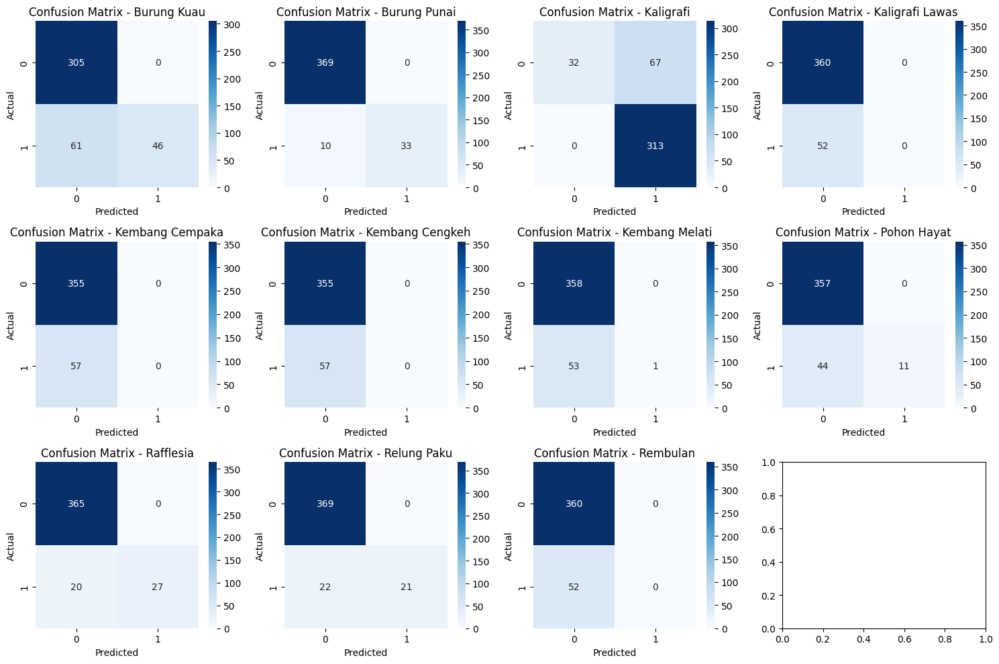

In [24]:
# Cell 3: Confusion Matrix per Label
from sklearn.metrics import classification_report, multilabel_confusion_matrix

cm_list = multilabel_confusion_matrix(y_true, y_pred)
fig, axes = plt.subplots(3, 4, figsize=(15, 10))
axes = axes.ravel()

for i, (label, cm) in enumerate(zip(labels, cm_list)):
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[i])
    axes[i].set_title(f'Confusion Matrix - {label}')
    axes[i].set_xlabel('Predicted')
    axes[i].set_ylabel('Actual')

plt.tight_layout()
plt.show()


### Menampilkan Gambar dengan Label dan Prediksi

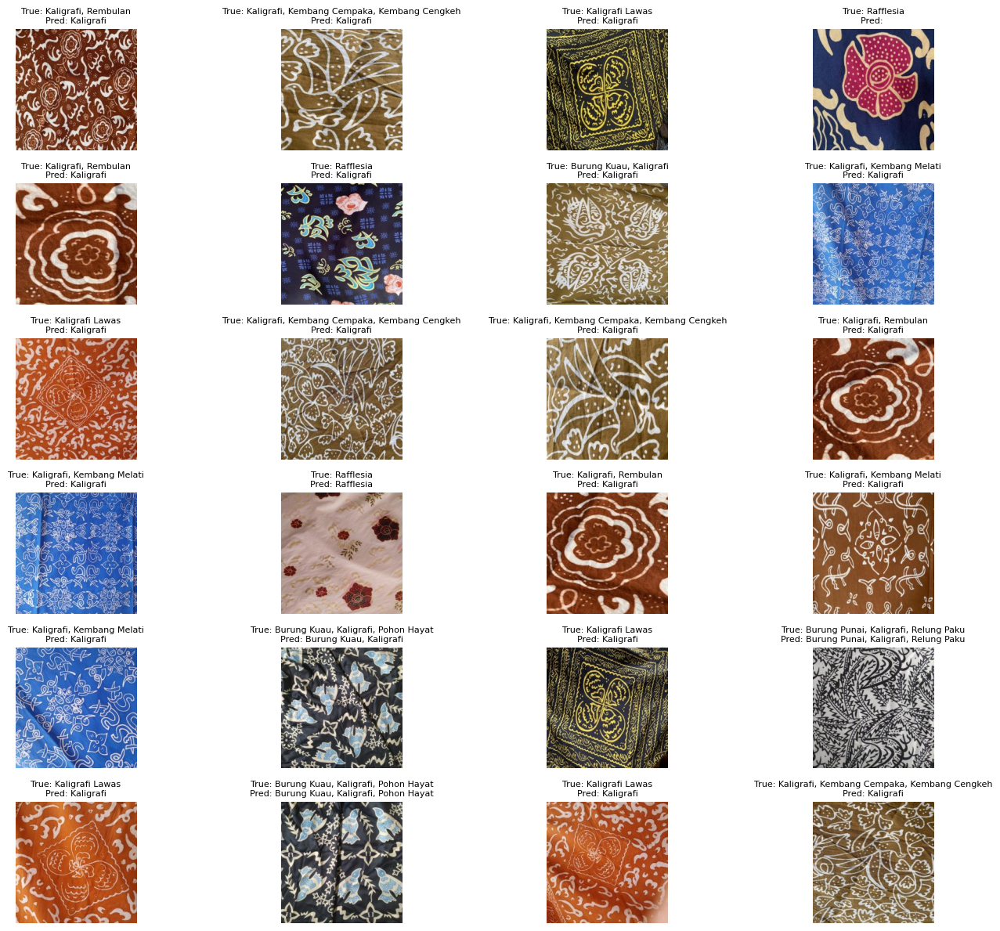

In [25]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load model
best_model_path = "/content/drive/MyDrive/Dataset/VGG16_2.h5"
model = tf.keras.models.load_model(best_model_path, compile=False)

# Ambil sampel data
num_samples = 24
sample_df = test_df.sample(num_samples, random_state=42)

# Buat plot
fig, axes = plt.subplots(6, 4, figsize=(15, 12))
axes = axes.ravel()

for i, (index, row) in enumerate(sample_df.iterrows()):
    img_path = os.path.join(test_img_folder, row["filename"])

    if os.path.exists(img_path):  # Pastikan file ada
        img = load_img(img_path, target_size=(224, 224))
        img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)

        # Prediksi
        y_pred_prob = model.predict(img_array, verbose=0)
        y_pred = (y_pred_prob > 0.5).astype(int).flatten()  # Perbaikan di sini
        y_true = row[1:].values.astype(int)

        # Label asli & prediksi
        true_labels = [label for label, t in zip(test_df.columns[1:], y_true) if t == 1]
        pred_labels = [label for label, p in zip(test_df.columns[1:], y_pred) if p == 1]

        # Plot gambar
        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(f"True: {', '.join(true_labels)}\nPred: {', '.join(pred_labels)}", fontsize=8)

# Atur tata letak agar lebih rapi
plt.subplots_adjust(hspace=1.0, wspace=0.5)
plt.tight_layout()
plt.show()


### Performa Metrik untuk Valid Data

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


26/26 ━━━━━━━━━━━━━━━━━━━━ 307s 12s/step

=== Model Performance on Validation Set ===
   Accuracy  Precision    Recall       AUC     Kappa  F1_score  Final_score
0  0.199271   0.708435  0.341694  0.980941  0.516181  0.403924     0.633682


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


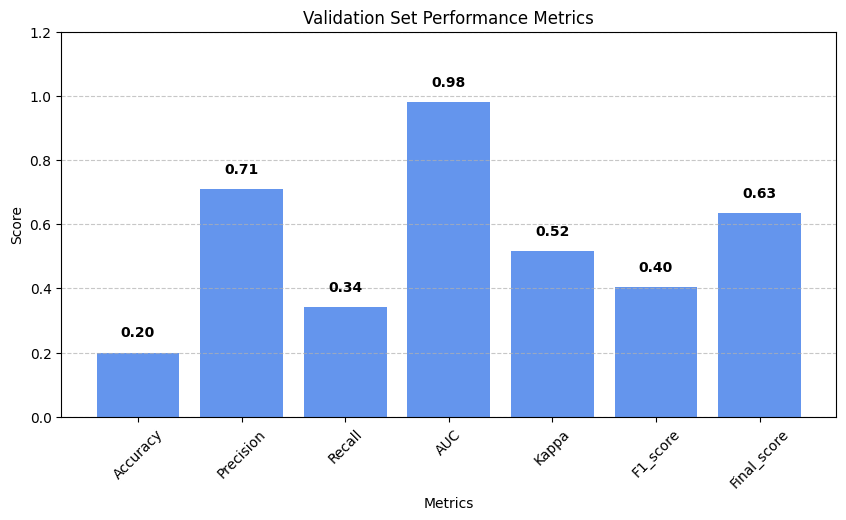

In [26]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, cohen_kappa_score

# Load model yang telah dilatih
model_path = "/content/drive/MyDrive/Dataset/VGG16_2.h5"
model = tf.keras.models.load_model(model_path)


y_true_valid = valid_generator.labels  # Label asli dari valid set
y_pred_probs_valid = model.predict(valid_generator)  # Probabilitas prediksi

# Konversi ke label biner (untuk evaluasi multi-label)
y_pred_valid = (y_pred_probs_valid >= 0.5).astype(int)  # Threshold 0.5

# Menghitung metrik evaluasi
accuracy_valid = accuracy_score(y_true_valid, y_pred_valid)
precision_valid = precision_score(y_true_valid, y_pred_valid, average='macro')
recall_valid = recall_score(y_true_valid, y_pred_valid, average='macro')
f1_valid = f1_score(y_true_valid, y_pred_valid, average='macro')
auc_valid = roc_auc_score(y_true_valid, y_pred_probs_valid, average='macro')
kappa_valid = cohen_kappa_score(y_true_valid.argmax(axis=1), y_pred_valid.argmax(axis=1))

# **Menghitung Final Score sebagai rata-rata dari F1-score, Kappa, dan AUC**
final_score_valid = np.mean([f1_valid, kappa_valid, auc_valid])

# Membuat tabel hasil evaluasi untuk validasi set
metrics_valid = {
    "Accuracy": [accuracy_valid],
    "Precision": [precision_valid],
    "Recall": [recall_valid],
    "AUC": [auc_valid],
    "Kappa": [kappa_valid],
    "F1_score": [f1_valid],
    "Final_score": [final_score_valid]  # Final score dari rata-rata F1-score, Kappa, dan AUC
}


df_valid = pd.DataFrame(metrics_valid)
print("\n=== Model Performance on Validation Set ===")
print(df_valid)

# **Visualisasi bar plot
plt.figure(figsize=(10, 5))
bars = plt.bar(df_valid.columns, df_valid.loc[0], color='cornflowerblue')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             yval + 0.05,
             f"{yval:.2f}",
             ha='center',
             fontsize=10,
             fontweight='bold')

plt.xlabel("Metrics")
plt.ylabel("Score")
plt.title("Validation Set Performance Metrics")
plt.ylim(0, 1.2)  # **Batas atas diperbesar agar ada ruang untuk teks**
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # **Menambah grid horizontal untuk estetika**
plt.show()


### Performa Metrik Untuk Test Data

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 170ms/step

=== Model Performance on Test Set ===
   Accuracy  Precision    Recall       AUC    Kappa  F1_score  Final_score
0  0.145631   0.620335  0.316246  0.979286  0.47647  0.375339     0.610365


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


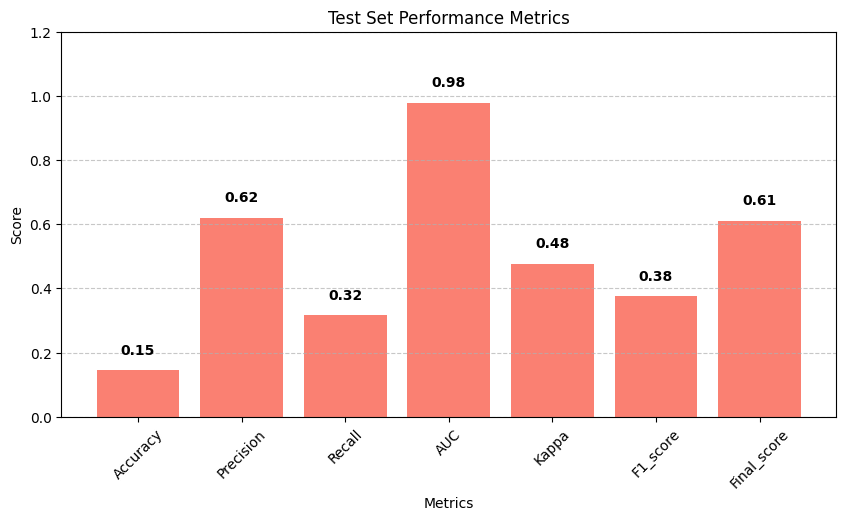

In [27]:
# Pastikan test_generator sudah dibuat sebelumnya
y_true_test = test_generator.labels  # Label asli dari test set
y_pred_probs_test = model.predict(test_generator)  # Probabilitas prediksi

# Konversi ke label biner (untuk evaluasi multi-label)
y_pred_test = (y_pred_probs_test >= 0.5).astype(int)  # Threshold 0.5

# Menghitung metrik evaluasi
accuracy_test = accuracy_score(y_true_test, y_pred_test)
precision_test = precision_score(y_true_test, y_pred_test, average='macro')
recall_test = recall_score(y_true_test, y_pred_test, average='macro')
f1_test = f1_score(y_true_test, y_pred_test, average='macro')
auc_test = roc_auc_score(y_true_test, y_pred_probs_test, average='macro')
kappa_test = cohen_kappa_score(y_true_test.argmax(axis=1), y_pred_test.argmax(axis=1))

# **Menghitung Final Score sebagai rata-rata semua metrik**
final_score_test = np.mean([f1_test, kappa_test, auc_test])

# Membuat tabel hasil evaluasi untuk test set
metrics_test = {
    "Accuracy": [accuracy_test],
    "Precision": [precision_test],
    "Recall": [recall_test],
    "AUC": [auc_test],
    "Kappa": [kappa_test],
    "F1_score": [f1_test],
    "Final_score": [final_score_test]  # Final score dari rata-rata F1-score, Kappa, dan AUC
}

df_test = pd.DataFrame(metrics_test)
print("\n=== Model Performance on Test Set ===")
print(df_test)

# **Visualisasi bar plot dengan nilai metrik di atas batang (jarak lebih rapi)**
plt.figure(figsize=(10, 5))
bars = plt.bar(df_test.columns, df_test.loc[0], color='salmon')

# Menambahkan nilai di atas setiap batang dengan jarak lebih rapi
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             yval + 0.05,  # **Menambah jarak dari batang agar lebih rapi**
             f"{yval:.2f}",
             ha='center',
             fontsize=10,
             fontweight='bold')

plt.xlabel("Metrics")
plt.ylabel("Score")
plt.title("Test Set Performance Metrics")
plt.ylim(0, 1.2)  # **Batas atas diperbesar agar ada ruang untuk teks**
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # **Menambah grid horizontal untuk estetika**
plt.show()


# **Prediksi dengan Interface**

In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 118.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 6.1 MB/s eta 0:00:00


In [ ]:
import gradio as gr
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load model
best_model_path = "/content/drive/MyDrive/Dataset/VGG16_2.h5"
model = tf.keras.models.load_model(best_model_path, compile=False)

# Label kategori
labels = ['Burung Kuau', 'Burung Punai', 'Kaligrafi', 'Kaligrafi Lawas', 'Kembang Cempaka',
          'Kembang Cengkeh', 'Kembang Melati', 'Pohon Hayat', 'Rafflesia', 'Relung Paku', 'Rembulan']

# Fungsi prediksi
def predict(image):
    img = image.resize((224, 224))  # Resize gambar
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)  # Normalisasi

    y_pred_prob = model.predict(img_array, verbose=0)
    y_pred = (y_pred_prob > 0.5).astype(int).flatten()

    pred_labels = [label for label, p in zip(labels, y_pred) if p == 1]
    return ', '.join(pred_labels) if pred_labels else "Tidak terdeteksi"

# Setup Gradio
iface = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="pil"),
    outputs=gr.Textbox(label="Hasil Prediksi"),
    title="Klasifikasi Motif Batik Besurek",
    description="Upload gambar batik besurek, lalu lihat hasil prediksi model!"
)

# Jalankan aplikasi
iface.launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://e6de43592ae2202570.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# **Prediksi dengan Input Data Internet**


Silakan upload gambar untuk prediksi:


Saving 3c0408349264d0cd33f2b618b291f5ee.jpg to 3c0408349264d0cd33f2b618b291f5ee.jpg


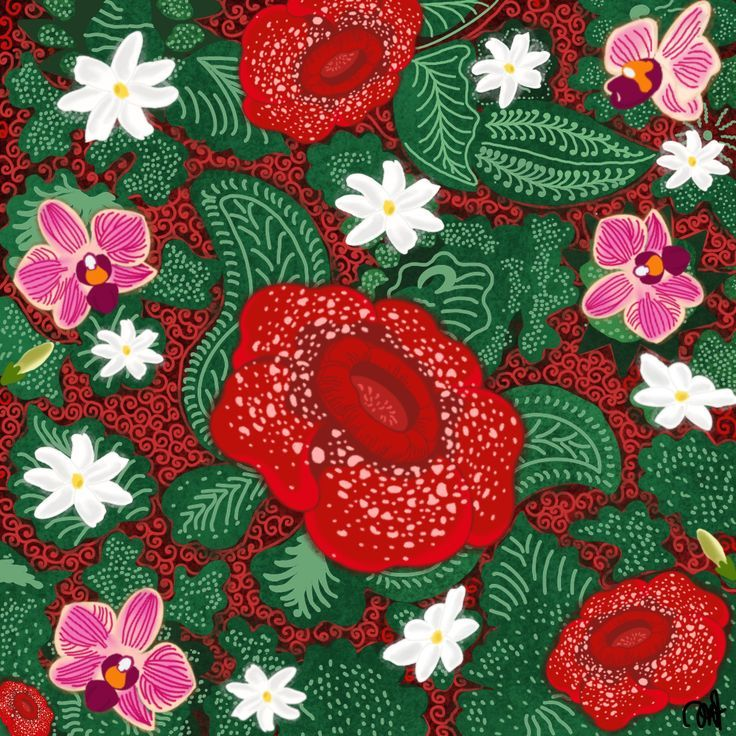


=== Hasil Prediksi ===
Rafflesia

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving burung kuau.jpeg to burung kuau.jpeg


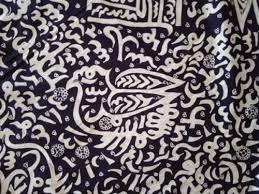


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving relung paku.png to relung paku.png


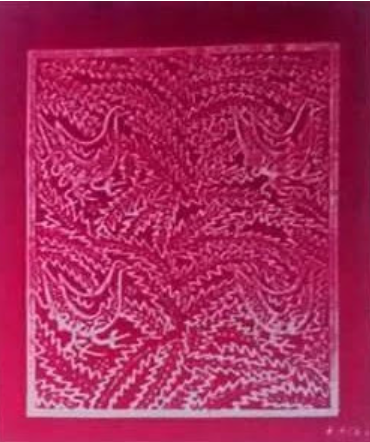


=== Hasil Prediksi ===
Burung Punai, Kaligrafi, Relung Paku

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving kembang cengkeh kembang cempaka.png to kembang cengkeh kembang cempaka.png


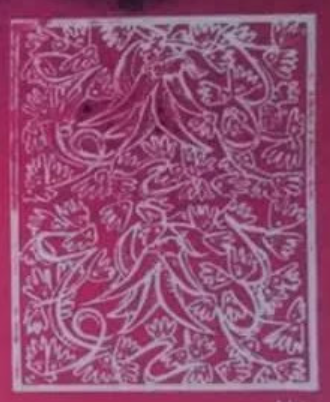


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving rembulan.jpeg to rembulan.jpeg


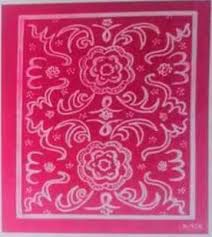


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Screenshot 2025-03-24 225529.png to Screenshot 2025-03-24 225529.png


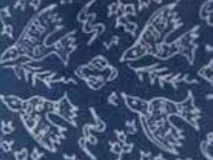


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving rembulann.jpeg to rembulann.jpeg


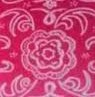


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi, Rembulan

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving kaligrafi arab.jpeg to kaligrafi arab.jpeg


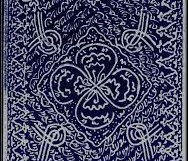


=== Hasil Prediksi ===
Kaligrafi, Kaligrafi Lawas

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving images (12).jpeg to images (12).jpeg


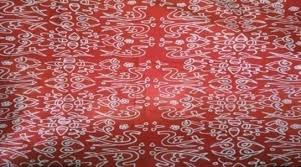


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Ilustrasi-Kain-Besurek-Bengkulu-Dok.-Kibrispdr.jpg to Ilustrasi-Kain-Besurek-Bengkulu-Dok.-Kibrispdr.jpg


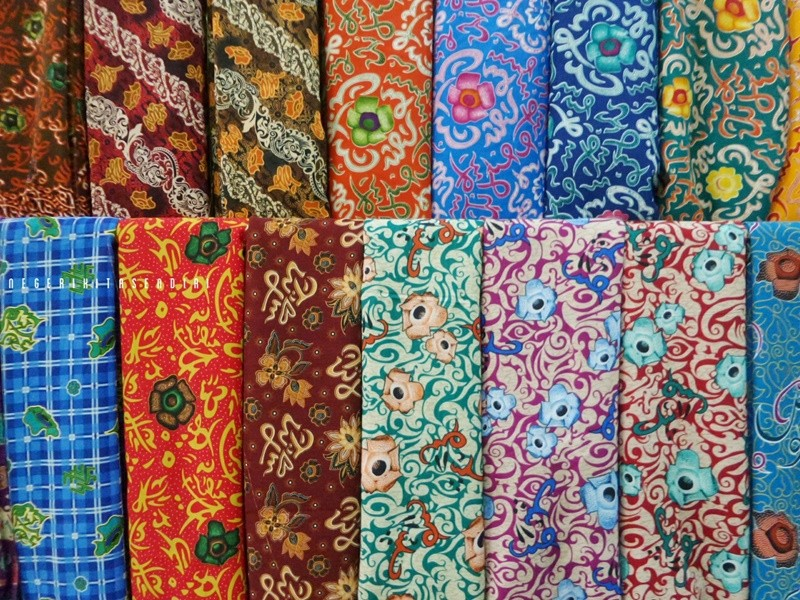


=== Hasil Prediksi ===
Tidak terdeteksi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving id-11134207-7r98v-lqu2zwdcr88vf0-1-a034866faddc3ffc6bb5b00b6031feb6-18e6e5af8f9198e45cfe56abc88529b1.jpeg to id-11134207-7r98v-lqu2zwdcr88vf0-1-a034866faddc3ffc6bb5b00b6031feb6-18e6e5af8f9198e45cfe56abc88529b1.jpeg


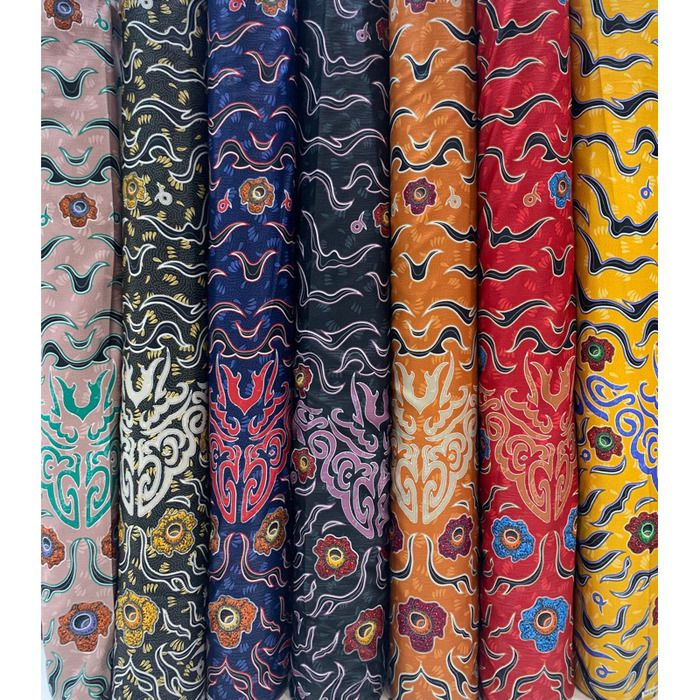


=== Hasil Prediksi ===
Tidak terdeteksi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving images (6).jpeg to images (6).jpeg


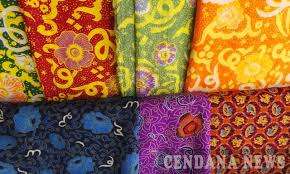


=== Hasil Prediksi ===
Tidak terdeteksi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving images (8).jpeg to images (8).jpeg


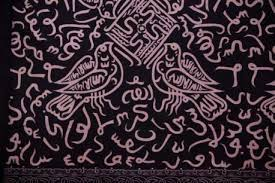


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi, Pohon Hayat

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Motif-Arab-pada-Basurek-300x225.jpg to Motif-Arab-pada-Basurek-300x225.jpg


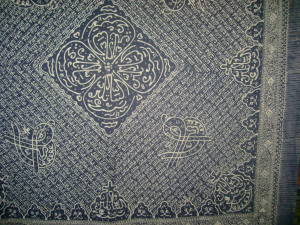


=== Hasil Prediksi ===
Kaligrafi Lawas

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Batik Besurek-8.jpg to Batik Besurek-8.jpg


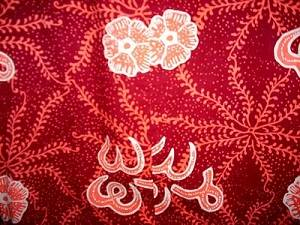


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): tidak

Terima kasih! Selesai.


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from google.colab import files
import IPython.display as display
from PIL import Image

# Load model
best_model_path = "/content/drive/MyDrive/Dataset/VGG16_1.h5"
model = tf.keras.models.load_model(best_model_path, compile=False)

# Label kategori
labels = ['Burung Kuau', 'Burung Punai', 'Kaligrafi', 'Kaligrafi Lawas', 'Kembang Cempaka',
          'Kembang Cengkeh', 'Kembang Melati', 'Pohon Hayat', 'Rafflesia', 'Relung Paku', 'Rembulan']

# Fungsi prediksi
def predict(image_path):
    img = load_img(image_path, target_size=(224, 224))  # Resize gambar
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)  # Normalisasi

    y_pred_prob = model.predict(img_array, verbose=0)
    y_pred = (y_pred_prob > 0.5).astype(int).flatten()

    pred_labels = [label for label, p in zip(labels, y_pred) if p == 1]
    return ', '.join(pred_labels) if pred_labels else "Tidak terdeteksi"

# Loop untuk upload & prediksi
while True:
    print("\nSilakan upload gambar untuk prediksi:")
    uploaded = files.upload()

    if uploaded:
        image_path = list(uploaded.keys())[0]
        img = Image.open(image_path)

        # Tampilkan gambar
        display.display(img)

        # Prediksi
        hasil_prediksi = predict(image_path)
        print("\n=== Hasil Prediksi ===")
        print(hasil_prediksi)

    # Tanya apakah ingin upload lagi
    lanjut = input("\nIngin upload gambar lain? (ya/tidak): ").strip().lower()
    if lanjut != "ya":
        print("\nTerima kasih! Selesai.")
        break
